<a href="https://colab.research.google.com/github/Ebl14/senales_y_sistemas/blob/main/Filtros.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

1. Descargue 10 segundos de la canción de su preferencia desde youtube, y generé un filtro pasabanda (el usuario debe poder definir las frecuencias de corte) para cada uno de los filtros descritos (el usuario también debe poder fijar los parámetros de diseño de cada filtro). Compare los resultados de los filtros estudiados en este cuaderno tipo IIR para diseño Butterworth, Chebyshev 1, Chebyshev 2, Bessel y Elíptico.

In [1]:
!pip install yt-dlp ffmpeg-python soundfile scipy librosa matplotlib -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.3/174.3 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 27.7 MB/s eta 0:00:00


In [2]:
import numpy as np
import soundfile as sf
import matplotlib.pyplot as plt
from scipy.signal import butter, cheby1, cheby2, ellip, bessel, filtfilt, freqz
from IPython.display import Audio, display
import librosa

# Descargar audio desde el nuevo link
link = "https://www.youtube.com/watch?v=nd6T5gemey4&list=RDnd6T5gemey4&start_radio=1"
!yt-dlp --extract-audio -o "audio.mp3" --audio-format mp3 {link}
!ffmpeg -i audio.mp3 -t 10 audio.wav -y

[youtube] Extracting URL: https://www.youtube.com/watch?v=nd6T5gemey4
[youtube] nd6T5gemey4: Downloading webpage
[youtube] nd6T5gemey4: Downloading tv client config
[youtube] nd6T5gemey4: Downloading player e12fbea4-main
[youtube] nd6T5gemey4: Downloading tv player API JSON
[youtube] nd6T5gemey4: Downloading ios player API JSON
[youtube] nd6T5gemey4: Downloading m3u8 information
[info] nd6T5gemey4: Downloading 1 format(s): 251
[download] Destination: audio.webm
[download] 100% of    3.60MiB in 00:00:00 at 12.53MiB/s
[ExtractAudio] Destination: audio.mp3
Deleting original file audio.webm (pass -k to keep)
ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --ena

In [12]:
x, fs = sf.read("audio.wav")

# Convertir a estéreo si es mono
if x.ndim == 1:
    x = np.stack([x, x], axis=-1)

# Escuchar original
print("🎧 Audio original")
display(Audio([x[:,1], x[:,0]], rate=fs))

# Parámetros de diseño del filtro pasabanda
orden = 6
filtro_tipo = "bandpass"
frecuencia_corte = [500, 3000]  # Puedes modificar
ripple_pass = 1  # Chebyshev I y elíptico
ripple_stop = 40  # Chebyshev II y elíptico

🎧 Audio original


In [13]:
def aplicar_filtro(tipo, x, fs):
    if tipo == "butter":
        b, a = butter(orden, frecuencia_corte, btype=filtro_tipo, fs=fs)
    elif tipo == "cheby1":
        b, a = cheby1(orden, ripple_pass, frecuencia_corte, btype=filtro_tipo, fs=fs)
    elif tipo == "cheby2":
        b, a = cheby2(orden, ripple_stop, frecuencia_corte, btype=filtro_tipo, fs=fs)
    elif tipo == "ellip":
        b, a = ellip(orden, ripple_pass, ripple_stop, frecuencia_corte, btype=filtro_tipo, fs=fs)
    elif tipo == "bessel":
        b, a = bessel(orden, frecuencia_corte, btype=filtro_tipo, fs=fs, norm='phase')
    else:
        raise ValueError("Tipo de filtro no válido")
    return b, a

def graficar_respuesta_frecuencia(b, a, fs, nombre):
    w, h = freqz(b, a, fs=fs, worN=8000)
    plt.figure(figsize=(8, 3))
    plt.plot(w, 20*np.log10(abs(h)))
    plt.title(f"Respuesta en frecuencia - {nombre}")
    plt.xlabel("Frecuencia [Hz]")
    plt.ylabel("Magnitud [dB]")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def graficar_espectros(x_original, x_filtrado, fs, nombre):
    X1 = np.abs(np.fft.rfft(x_original[:,0]))
    X2 = np.abs(np.fft.rfft(x_filtrado[:,0]))
    freqs = np.fft.rfftfreq(len(x_original), d=1/fs)

    plt.figure(figsize=(8, 3))
    plt.plot(freqs, X1, label="Original", alpha=0.5)
    plt.plot(freqs, X2, label="Filtrado", alpha=0.7)
    plt.title(f"Espectro de magnitud - {nombre}")
    plt.xlabel("Frecuencia [Hz]")
    plt.ylabel("Magnitud")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()



🎧 Butterworth


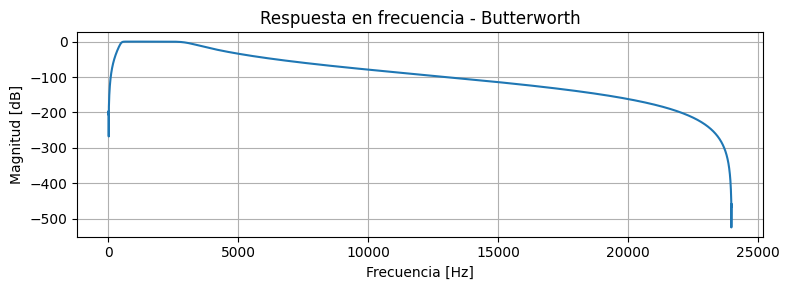

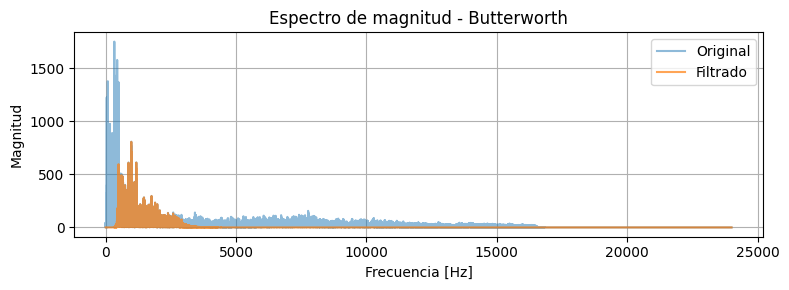


🎧 Chebyshev I


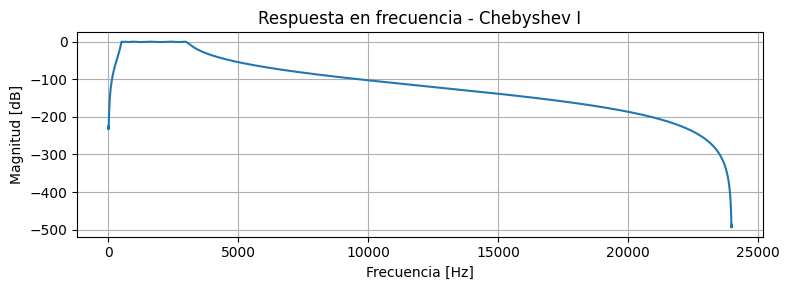

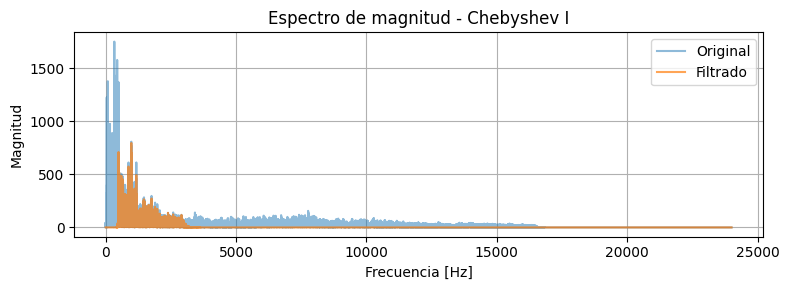


🎧 Chebyshev II


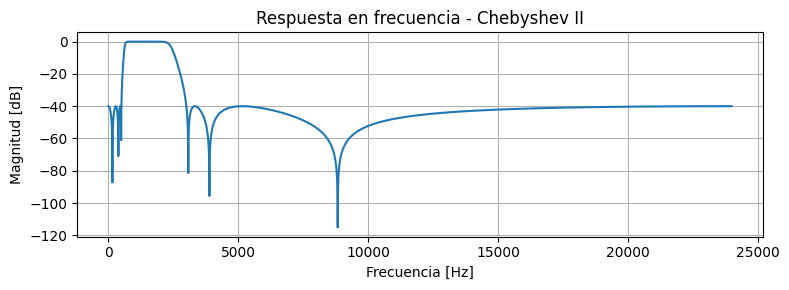

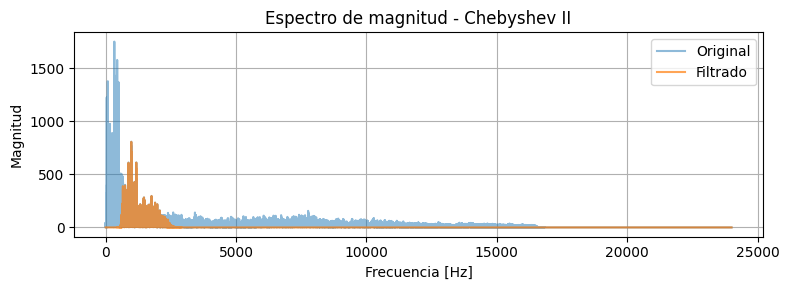


🎧 Elíptico


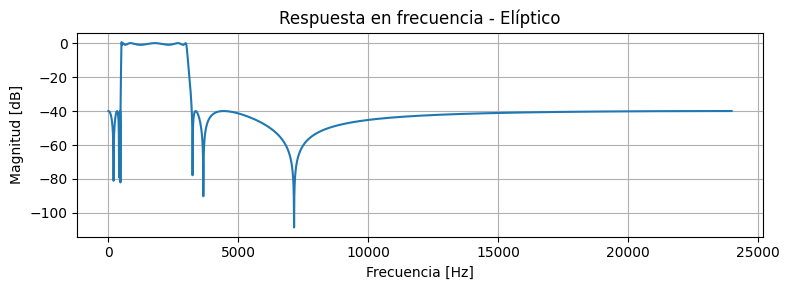

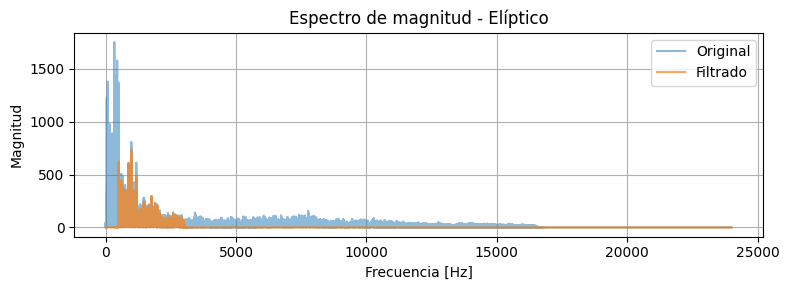


🎧 Bessel


/tmp/ipython-input-13-1275688301.py:19: RuntimeWarning: divide by zero encountered in log10
  plt.plot(w, 20*np.log10(abs(h)))


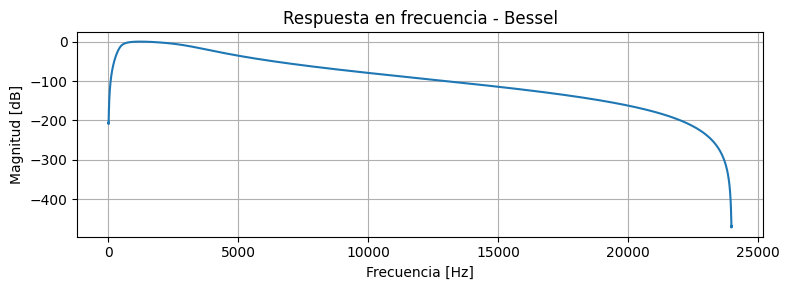

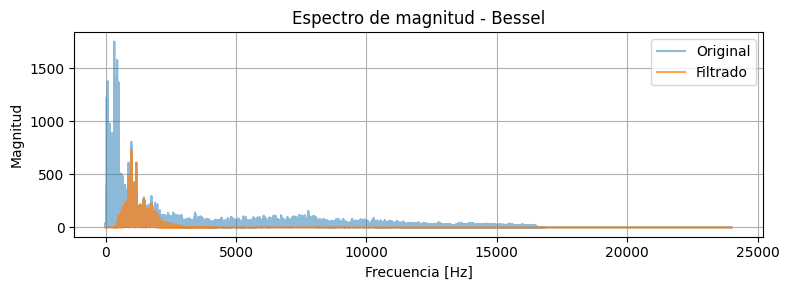

In [14]:
filtros = ["butter", "cheby1", "cheby2", "ellip", "bessel"]
nombres = ["Butterworth", "Chebyshev I", "Chebyshev II", "Elíptico", "Bessel"]

for tipo, nombre in zip(filtros, nombres):
    print(f"\n🎧 {nombre}")
    b, a = aplicar_filtro(tipo, x, fs)

    # Audio filtrado
    xf = filtfilt(b, a, x, axis=0)
    display(Audio([xf[:,1], xf[:,0]], rate=fs))

    # Respuesta en frecuencia
    graficar_respuesta_frecuencia(b, a, fs, nombre)

    # Comparación de espectros
    graficar_espectros(x, xf, fs, nombre)


2. Consulte en qué consiste el método de diseño de filtros FIR por ventaneo (Ver función [firwin](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.firwin.html) y [material de apoyo](https://www.programcreek.com/python/example/100540/scipy.signal.firwin)). Realice un cuadro comparativo de las ventajas y desventajas de los filtros IIR y los FIR. Nota: Recuerde que un filtro FIR utiliza solamente raíces tipo ceros, es decir que $a_0=1$, y $a_k=0$ $\forall k\in\{1,2,\dots\}$.

3. Incluya la implementación del filtro `firwin` en el punto 1.